# NN autoencoder on STFT data

Taken from https://github.com/pkmital/tensorflow_tutorials/blob/master/python/08_denoising_autoencoder.py

In [1]:
from __future__ import division, print_function, absolute_import
%pylab inline

import tensorflow as tf
import numpy as np
import os
import librosa
import librosa.display
from  librosa.util import frame
from scipy.signal import resample

%run ../utils.py
%run nnutils.py

rc_default()

Populating the interactive namespace from numpy and matplotlib


In [2]:
path = "../wavs/"
fname = 'Grisey_partiels.wav'

name = fname[:-4]

filename = path+fname

fs,track = fragment_from_wav(filename,0,120)

track = resample(track,int(track.size/2.0))
fs = fs/2.0

NFFT = 2**11
HOP = int(NFFT/4)

STFT = librosa.stft(track,n_fft=NFFT, hop_length=HOP,center=True).T
mel = librosa.feature.melspectrogram(S=abs(STFT)**2).T

X = abs(STFT/float(NFFT)/2)**2

/home/digitalhouse/anaconda2/lib/python2.7/site-packages/scipy/io/wavfile.py:267: WavFileWarning: Chunk (non-data) not understood, skipping it.
  WavFileWarning)


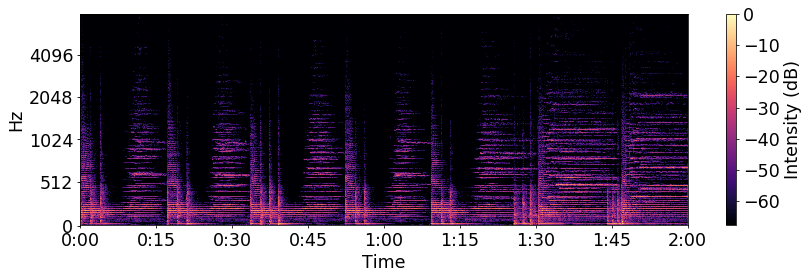

In [3]:
figure(figsize=(14,4))
librosa.display.specshow(librosa.logamplitude(X.T,ref_power=np.max),hop_length = HOP, sr=fs,y_axis='mel', fmax=8000, x_axis='time')
colorbar(label='Intensity (dB)');

In [4]:
print("Dimensions: freq bins, time bins")
X = X[:,:NFFT//2]
time_bins,freq_bins = X.shape
print(freq_bins,time_bins)

Dimensions: freq bins, time bins
1024 5168


## Create dataset  (Data class) with spectrum

In [5]:
Xlog = log10(X)
meanX = Xlog.mean(0)
stdX = Xlog.std(0)+0.001
Xnorm = (Xlog-meanX)/stdX
data = Data( Xnorm )

## Neural Autoencoder parameters

In [6]:
display_step = 10
batch_size = 2000
n_epochs = 300
learning_rate = 0.0015
l2scale = 0.00000000001
dimensions= [1024,512,256,128,64,32,16]
activation = tf.nn.tanh

In [7]:
nae = NAE(freq_bins,dimensions,activation=activation,bias=True,l2scale=l2scale,learning_rate=learning_rate,stddev=0.1,meaninit=.00)
nae.init_session()

In [8]:
costlist,costnoreglist = nae.train(data, batch_size, n_epochs)

Run the command line:
--> tensorboard --logdir=/tmp/tensorflow_logs 
Then open http://0.0.0.0:6006/ into your web browser
('Epoch:', '0000', 'cost=', '0.758625090')
('Epoch:', '0010', 'cost=', '0.411669821')
('Epoch:', '0020', 'cost=', '0.378837913')
('Epoch:', '0030', 'cost=', '0.364833325')
('Epoch:', '0040', 'cost=', '0.352341056')
('Epoch:', '0050', 'cost=', '0.349097967')
('Epoch:', '0060', 'cost=', '0.343379080')
('Epoch:', '0070', 'cost=', '0.340934455')
('Epoch:', '0080', 'cost=', '0.334520996')
('Epoch:', '0090', 'cost=', '0.334117502')
('Epoch:', '0100', 'cost=', '0.331493884')
('Epoch:', '0110', 'cost=', '0.330736578')
('Epoch:', '0120', 'cost=', '0.330283552')
('Epoch:', '0130', 'cost=', '0.327753156')
('Epoch:', '0140', 'cost=', '0.322624773')
('Epoch:', '0150', 'cost=', '0.322293550')
('Epoch:', '0160', 'cost=', '0.318075925')
('Epoch:', '0170', 'cost=', '0.321864605')
('Epoch:', '0180', 'cost=', '0.318177462')
('Epoch:', '0190', 'cost=', '0.319476068')
('Epoch:', '0200',

In [9]:
nae.save("checkpoints/NAE1")

Model saved in file: checkpoints/NAE1.ckpt


In [ ]:
nae.load("checkpoints/NAE1")

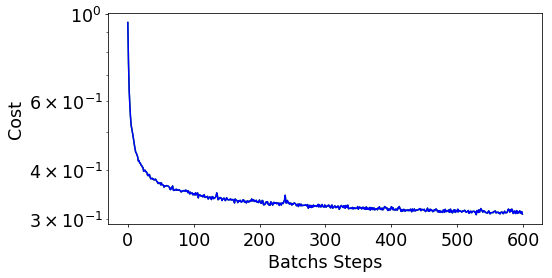

In [10]:
figure(figsize=(8,4))
semilogy(costlist,'g')
semilogy(costnoreglist,'b')
ylabel('Cost')
xlabel('Batchs Steps');

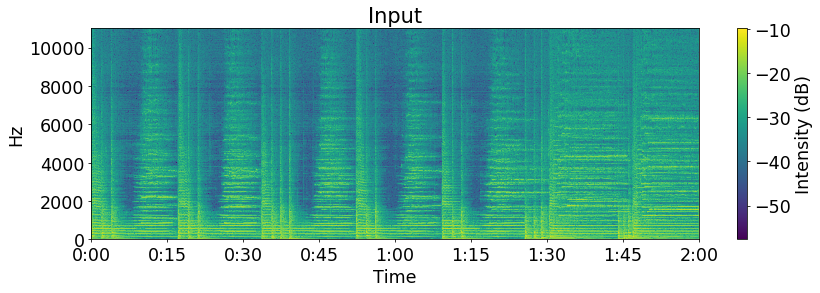

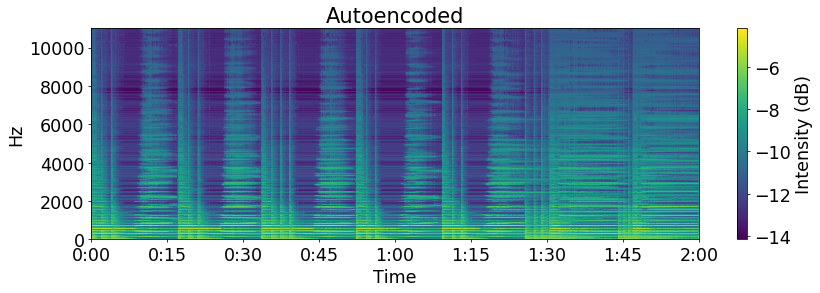

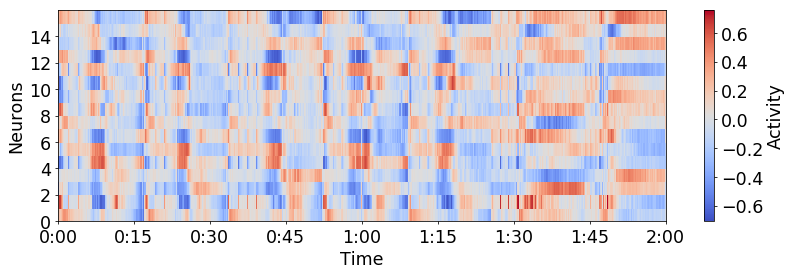

In [13]:
sess = nae.get_session()
variable_dict = nae.get_variables_dict()

SAVEFIG = False

duration = track.size/fs
compare = range(0,time_bins,1)
recon = sess.run(variable_dict['Y'], feed_dict={ variable_dict['X']: data.data[compare]})

orig = data.data[compare]
M = orig*stdX+meanX

figure(figsize=(14,4))

librosa.display.specshow(M.T,hop_length = HOP,sr=fs,y_axis='linear', fmax=8000, x_axis='time',cmap = cm.viridis)

title('Input')
colorbar(label='Intensity (dB)')
if SAVEFIG:plt.savefig('figs/original')

M = recon*stdX+meanX

figure(figsize=(14,4))

librosa.display.specshow(M.T,hop_length = HOP,sr=fs,y_axis='linear', fmax=8000, x_axis='time',cmap = cm.viridis)

title('Autoencoded');
colorbar(label='Intensity (dB)');
if SAVEFIG: plt.savefig('figs/ae')
    
figure(figsize=(14,4))
Z = sess.run(variable_dict['z'], feed_dict={ variable_dict['X']: data.data[compare]})
idx = np.lexsort(Z)
librosa.display.specshow(Z.T,hop_length = HOP,sr=fs, x_axis='time')
yticks(range(0,Z[0].size,2))
ylabel('Neurons')
colorbar(label='Activity')
if SAVEFIG: plt.savefig('figs/Z')

In [12]:
from IPython.display import Audio, display

M = recon*stdX+meanX
M_ = zeros((M.shape[0],M.shape[1]+1),dtype=float32)
M_[:,:M.shape[1]] = sqrt(10**(M))

out = librosa.istft(M_.T,hop_length=HOP, win_length=NFFT, center=True)

display(Audio(data=out,rate=fs))
display(Audio(data=track,rate=fs))